# Full Photometry Pipeline

This tutorial demonstrates how to run the end--to--end photometry pipeline on
real JWST data included with *Mophongo*. We build templates from the F444W
mosaic and fit fluxes in the F770W image using spatially varying PSF
matching kernels.

## Detect sources in F444W

In [4]:
from pathlib import Path
import numpy as np
from astropy.io import fits

data_dir = Path('../data')
#field = 'uds-test'
field = 'uds-test2'
#field = 'uds-medium'
#field = 'uds-large'
sci_444 = data_dir / f'{field}-f444w_sci.fits'
wht_444 = data_dir / f'{field}-f444w_wht.fits'


## Build PSF region map

In [ ]:
from mophongo.psf import DrizzlePSF
from mophongo.psf_map import PSFRegionMap

# initialize drizzler; also reads the associated _wcs.csv files (rate files wcs/header information)
csv444 = glob.glob(str(data_dir)+'/uds*444*_wcs.csv')[0]
csv770 = glob.glob(str(data_dir) + '/uds*770*_wcs.csv')[0]
dpsf_444 = DrizzlePSF(driz_image=str(sci_444), csv_file=csv444)
dpsf_770 = DrizzlePSF(driz_image=str(sci_444).replace('444', '770'), csv_file=csv770)

# map unique detector overlaps; keep only footprints overlapping the target mosaic
prm_444 = PSFRegionMap.from_footprints(dpsf_444.footprint, name='F444W').overlay_with(dpsf_444.driz_footprint)
prm_770 = PSFRegionMap.from_footprints(dpsf_770.footprint, name='F770W').overlay_with(dpsf_444.driz_footprint)

# compute overlay regions unique to both PSFs
prm_kern = prm_444.overlay_with(prm_770)
prm_444.plot()
prm_770.plot()
prm_kern.plot()
prm_kern.regions

FileNotFoundError: CSV file ../data/uds-test2-f770w_wcs.csv not found

## Create PSF kernels

In [3]:
import mophongo.utils as utils

psf_dir = data_dir / 'PSF'
stpsf_444 = 'UDS_NRC.._F444W_OS4_GRID25'
stpsf_770 = 'UDS_MIRI_F770W_OS4_GRID9'
size = 101

# centroid positions of the regions
pos = [np.squeeze(p.xy) for p in prm_kern.regions.geometry.centroid]

# load webb psfs
dpsf_444.epsf_obj.load_jwst_stdpsf(local_dir=str(psf_dir), filter_pattern=stpsf_444)
dpsf_770.epsf_obj.load_jwst_stdpsf(local_dir=str(psf_dir), filter_pattern=stpsf_770)

# drizzle at centroid positions
prm_444.psfs = dpsf_444.get_psf_radec(pos, size=size)
prm_770.psfs = dpsf_770.get_psf_radec(pos, size=size)

# store the PSFs + region maps
prm_444.to_file(data_dir / f'{field}-f444w_psf.geojson')
prm_770.to_file(data_dir / f'{field}-f770w_psf.geojson')

# match kernels
# @@@ need a better way to determine best fft window shape
kernels = [utils.matching_kernel(psf_444, psf_770, recenter=True) for psf_444, psf_770 in zip(prm_444.psfs, prm_770.psfs)]

prm_kern.psfs = np.asarray(kernels)
prm_kern.to_file(data_dir / f'{field}-f444w_kernel_f770w.geojson')

NameError: name 'prm_kern' is not defined

## Run photometry

In [4]:
from pathlib import Path
from astropy.io import fits
from mophongo.psf_map import PSFRegionMap
from mophongo.fit import FitConfig
from mophongo.catalog import Catalog
from mophongo import pipeline

data_dir = Path('../data')
field = 'uds-test'
field = 'uds-test2'
#field = 'uds-medium'
#field = 'uds-large'
sci_444 = data_dir / f'{field}-f444w_sci.fits'
wht_444 = data_dir / f'{field}-f444w_wht.fits'

prm_kern = PSFRegionMap.from_geojson(str(data_dir / f'{field}-f444w_kernel_f770w.geojson'))
prm_444 = PSFRegionMap.from_geojson(str(data_dir / f'{field}-f444w_psf.geojson'))
prm_770 = PSFRegionMap.from_geojson(str(data_dir / f'{field}-f770w_psf.geojson'))

# MIRI images
img_770 = fits.getdata(data_dir / f'{field}-f770w_sci.fits')
img_770 = fits.getdata(data_dir / f'{field}reproject-nn-f770w_sci.fits')
wht_770 = fits.getdata(data_dir / f'{field}-f770w_wht.fits')

# read in LW selected catalog
seg_LW = data_dir / f'{field}-LW_seg.fits'
cat444 = Catalog.from_fits(sci_444, wht_444, segmap=seg_LW, estimate_ivar=True)
cat770 = Catalog.from_fits(img_770, wht_770, segmap=seg_LW, estimate_ivar=True) 

residual = [None, None, None, None]


Measuring inverse variance map...
Measuring inverse variance map...


In [5]:
# first fit, no shifts: first image is template, 2nd and on the fitting images
table, res, fit = pipeline.run([cat444.sci, cat770.sci], cat444.segmap.data,
                                weights=[cat444.ivar, cat770.ivar],
                                catalog=cat444.table,
                                psfs=[prm_444, prm_770],
                                kernels=[None, prm_kern],
                                wcs=[cat444.wcs]* 2,
                                config=FitConfig(fit_astrometry_niter=0))
residual[0] = res[0]
fits.writeto('residual_noshift.fits', data=residual[0], overwrite=True)
fits.writeto('model_noshift.fits', data=cat770.sci-residual[0], overwrite=True)

Pipeline (start) memory: 0.6 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=0, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='gp', astrom_centroid='centroid', astrom_kwargs={'poly': {'order': 2}, 'gp': {'length_scale': 500}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=False, multi_tmpl_colour=False, multi_resolution_method='downsample', normal='tree')


Extracting templates: 100%|██████████| 418/418 [00:00<00:00, 4729.84it/s]

Pipepline: 416 extracted templates, dropped 2.
Pipeline (templates) memory: 0.6 GB
Using kernel lookup table uds-test2-f444w_kernel_f770w



Convolving templates: 100%|██████████| 416/416 [00:00<00:00, 2780.23it/s]


Pipeline (convolved) memory: 0.6 GB
Running iteration 1 of 1


Building Normal matrix: 100%|██████████| 416/416 [00:00<00:00, 23801.36it/s]


Pipeline (residual) memory: 0.6 GB


Building Normal matrix: 100%|██████████| 416/416 [00:00<00:00, 26878.69it/s]


Done...
Pipeline (end) memory: 0.6 GB


### Separate flux and astrometric fit

First fit fluxes, then astrometric shift field, iterate.

In [6]:
# NOTE: the 'separate' astro+flux path was removed with the legacy solver;
# astrometry is always joint now, so this is the same as the cell below.
config = FitConfig(fit_astrometry_niter=3)
table1, res1, fit1 = pipeline.run([cat444.sci, cat770.sci],
                                cat444.segmap.data,
                                weights=[cat444.ivar, cat770.ivar],
                                catalog=cat444.table,  
                                psfs=[prm_444, prm_770],
                                kernels=[None, prm_kern],
                                wcs=[cat444.wcs] * 2,
                                config=config)
residual[1] = res1[0]
fits.writeto('residual_separate.fits', data=residual[1], overwrite=True)
fits.writeto('model_separate.fits', data=cat770.sci-residual[1], overwrite=True)

Pipeline (start) memory: 0.6 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=3, fit_astrometry_joint=False, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='gp', astrom_centroid='centroid', astrom_kwargs={'poly': {'order': 2}, 'gp': {'length_scale': 500}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=False, multi_tmpl_colour=False, multi_resolution_method='downsample', normal='tree')


Extracting templates: 100%|██████████| 418/418 [00:00<00:00, 4672.42it/s]


Pipepline: 416 extracted templates, dropped 2.
Pipeline (templates) memory: 0.6 GB
Using kernel lookup table uds-test2-f444w_kernel_f770w


Convolving templates: 100%|██████████| 416/416 [00:00<00:00, 2807.18it/s]


Pipeline (convolved) memory: 0.7 GB
Running iteration 1 of 3


Building Normal matrix: 100%|██████████| 416/416 [00:00<00:00, 24495.04it/s]


Pipeline (residual) memory: 0.7 GB
Running iteration 2 of 3


Building Normal matrix: 100%|██████████| 416/416 [00:00<00:00, 29799.67it/s]

Pipeline (residual) memory: 0.7 GB


Running iteration 3 of 3


Building Normal matrix: 100%|██████████| 416/416 [00:00<00:00, 28607.06it/s]

Pipeline (residual) memory: 0.7 GB



Building Normal matrix: 100%|██████████| 416/416 [00:00<00:00, 27921.31it/s]

Done...
Pipeline (end) memory: 0.7 GB


###  Joint photometric and astrometric fit

Append Cheby polynomial coefficients to sparse matrix and solve jointly.

In [7]:
# test astrometry fit vs number of iterations for joint astro + flux fit
if True:
    config = FitConfig(fit_astrometry_niter=2,
                    astrom_kwargs = {'poly': {'order': 3}})
    table2, res2, fit2 = pipeline.run([cat444.sci, cat770.sci],
                                    cat444.segmap.data,
                                    weights=[cat444.ivar, cat770.ivar],
                                    catalog=cat444.table,
                                    psfs=[prm_444, prm_770],
                                    kernels=[None, prm_kern],
                                    wcs=[cat444.wcs] * 2,
                                    config=config)
    residual[2] = res2[0]
    fits.writeto('residual_joint.fits', data=residual[2], overwrite=True)
    fits.writeto('model_joint.fits', data=cat770.sci-residual[2], overwrite=True)
else:
    residual[2] = None

Pipeline (start) memory: 0.7 GB
Pipeline config: FitConfig(positivity=False, reg=0.0, bad_value=nan, solve_method='ata', cg_kwargs={'M': None, 'maxiter': 500, 'atol': 1e-06}, fit_covariances=False, fft_fast=False, fit_astrometry_niter=2, fit_astrometry_joint=True, reg_astrom=0.0001, snr_thresh_astrom=10.0, astrom_model='gp', astrom_centroid='centroid', astrom_kwargs={'poly': {'order': 3}}, multi_tmpl_chi2_thresh=5.0, multi_tmpl_psf_core=False, multi_tmpl_colour=False, multi_resolution_method='downsample', normal='tree')


Extracting templates: 100%|██████████| 418/418 [00:00<00:00, 2448.39it/s]

Pipepline: 416 extracted templates, dropped 2.
Pipeline (templates) memory: 0.7 GB
Using kernel lookup table uds-test2-f444w_kernel_f770w



Convolving templates: 100%|██████████| 416/416 [00:00<00:00, 3000.40it/s]


Pipeline (convolved) memory: 0.7 GB
Running iteration 1 of 2
GlobalAstroFitter: templates in 416
GlobalAstroFitter: 416 templates and 37 with S/N >= 10.0 used for astrometry


Building Normal matrix: 100%|██████████| 1150/1150 [00:00<00:00, 16118.84it/s]


Pipeline (residual) memory: 1.0 GB
Running iteration 2 of 2
GlobalAstroFitter: templates in 416
GlobalAstroFitter: 416 templates and 34 with S/N >= 10.0 used for astrometry


Building Normal matrix: 100%|██████████| 1094/1094 [00:00<00:00, 16285.09it/s]


Pipeline (residual) memory: 1.1 GB


Building Normal matrix: 100%|██████████| 1094/1094 [00:00<00:00, 16004.94it/s]


Done...
Pipeline (end) memory: 1.1 GB


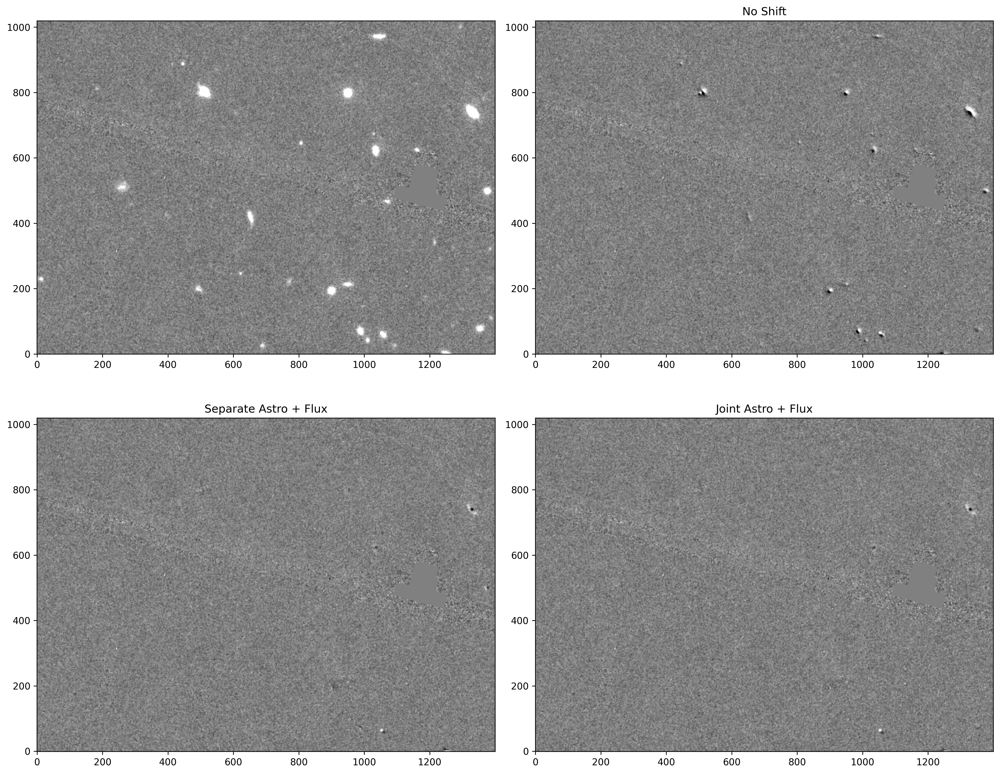

In [8]:
from matplotlib import pyplot as plt
s = 0.5
fig, ax = plt.subplots(2, 2, figsize=(15, 12))
ax = ax.flatten()
titles= ['No Shift', 'Separate Astro + Flux', 'Joint Astro + Flux']
ax[0].imshow(cat770.sci, origin='lower', cmap='gray', vmin=-s, vmax=s)
for i in range(3):
    if residual[i] is None:
        ax[i+1].axis('off')
        continue
    ax[i+1].imshow(residual[i], origin='lower', cmap='gray', vmin=-s, vmax=s)
    ax[i+1].set_title(titles[i])
plt.tight_layout()

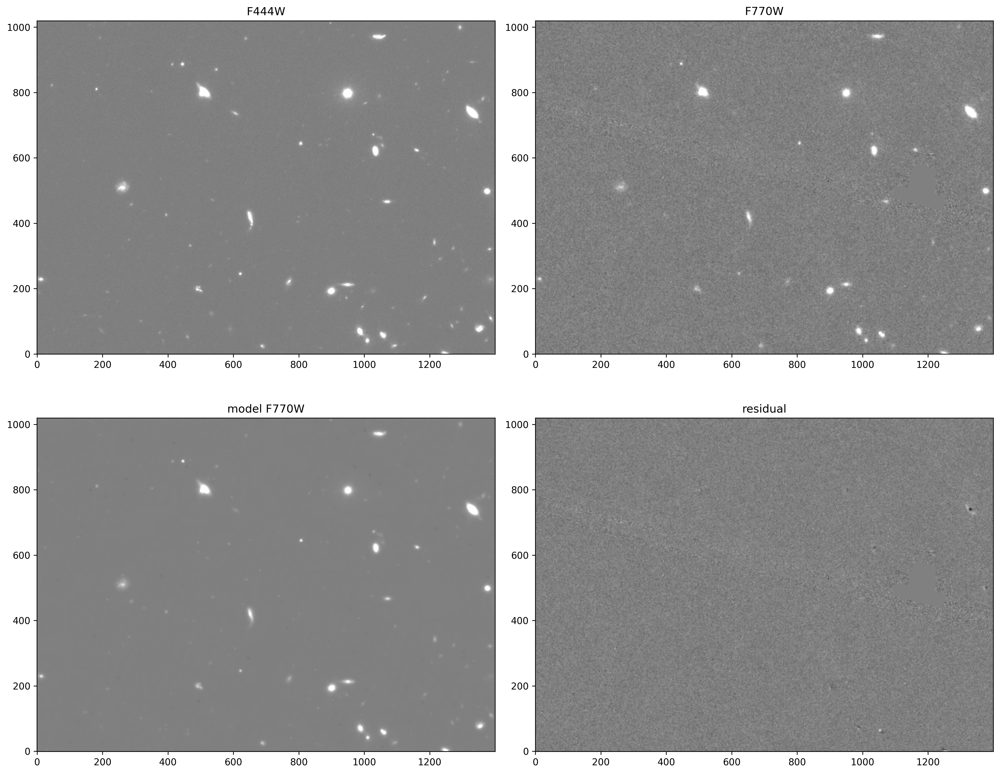

In [11]:
from matplotlib import pyplot as plt
img = [cat444.sci*1, cat770.sci, cat770.sci - residual[1], residual[1]] 
titles = ['F444W', 'F770W', 'model F770W', 'residual']
fig, ax = plt.subplots(2, 2, figsize=(15, 12))
ax = ax.flatten()
for i in range(4):
    ax[i].imshow(img[i], origin='lower', cmap='gray', vmin=-1, vmax=1)
    ax[i].set_title(f'{titles[i]}')
plt.tight_layout() 

In [4]:
residual

[array([[-0.06273204, -0.06273204, -0.06823062, ..., -0.03429287,
         -0.01622486, -0.01622392],
        [-0.06273207, -0.06273207, -0.06823066, ..., -0.03428858,
         -0.01622   , -0.01621929],
        [-0.03322397, -0.03322396, -0.04844574, ..., -0.02840945,
         -0.03097479, -0.03097385],
        ...,
        [-0.0214001 , -0.0214001 ,  0.04811706, ...,  0.03807594,
          0.04404134,  0.04385878],
        [ 0.03182149,  0.03182149, -0.06937444, ...,  0.06885925,
         -0.00133574, -0.00148167],
        [ 0.03182149,  0.03182149, -0.06937444, ...,  0.06881911,
         -0.00133595, -0.00143722]], shape=(820, 1000)),
 None,
 None,
 None]